## Machine Translation

### T44 - Sequence - Sequence Learning - Encoder and Decoder Intuition

These model which takes Sequence of Information and Outputs Sequence of information . \
Example : Language Translation , Image to Text conversion , Text to Images , Automated Replies in LinkedIn

Two main Component of Sequence to Sequence Learning are :
1. Encoder 
2. Decoder

#### Encoder 

Language Translation - (English - A,B,C ---- French - X,Y,Z)

If we take an Example of Language Translation (English to French) . Here we take one neural network Architecture - LSTM \
In encoder - Output at each RNN is not there , Instead it will be present at only last time stamp.At last RNN we will have Output (Context Vector).

All operations will be same as LSTM in Encoder , Only output is not present.

Once we have Context Vector it is passed to Decoder

We will get context vector when all three words A,B,C are passed 

#### Decoder

We will get first outptut - X , which will then be passed to next RNN as input to get Y and so on.

Once we find y1,y2,y3 hat we calculate loss

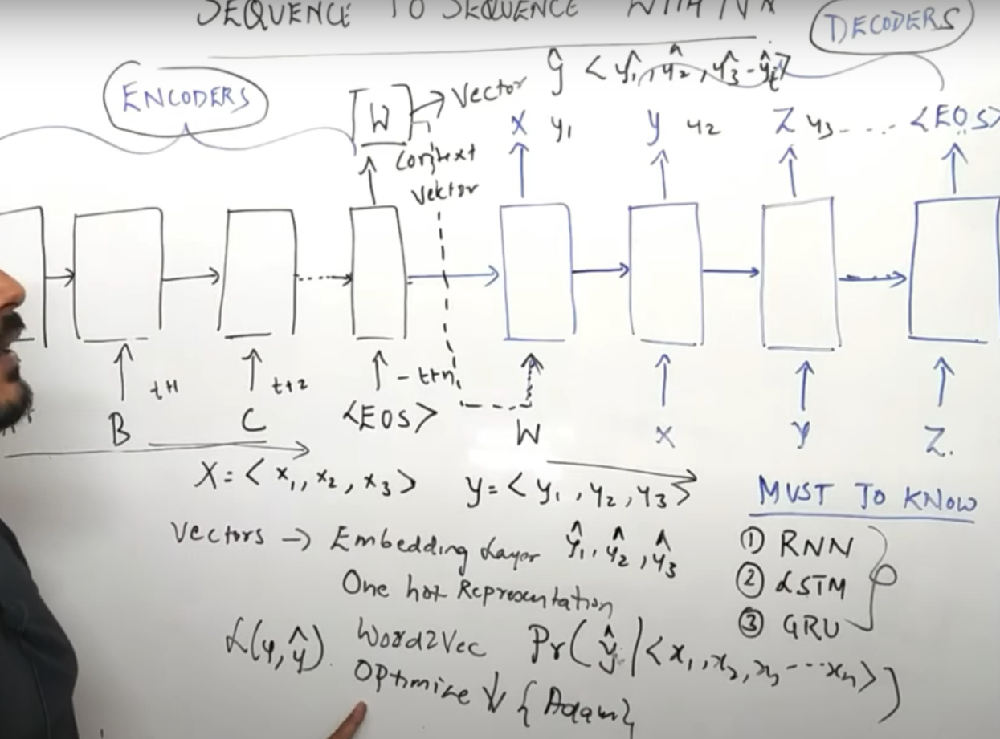

###  In Image Captioning 

Encoder -- We use Advanced CNN  - vgg16, resnet - Transfer learning 
Decoder - LSTM

#### When we have Long Sentences - Translation Accuracy decreases

So we use Attention Model (Bidirectional LSTM is used)

### T45  - Sequence-to-Sequence Learning - Encoder and Decoder -- Keras

See Practical Implementation

###  T46 - Problems with Encoder and Decoder

Researcher started working on Machine Translation w.r.t different different sentence lengths . If sentence length is small then Encoder and Decoder is able to translate . But when sentence length is very big its accuracy is not good

If Sentence has 100 words , Encoder and Decoder is not able to translate the sentence into French

##### Bleu Score

As you can see from below figure , As sentence length increases , Bleu score comes down

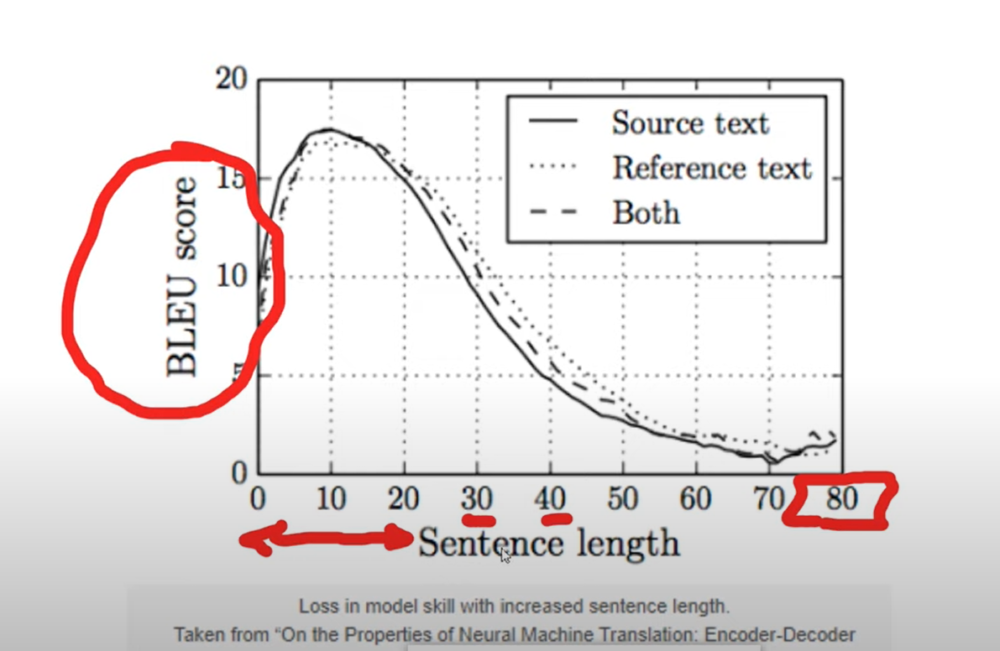


We dont consider output in encoder and last output is then given to decoder . So when sentences are very long , Vector generated in Encoder is not able to capture all the information about all words 

In order to overcome above Problems ATTENTION MODELS are used

In attention models -- Bidirectional LSTMS are used 

Initially we will take window size words in sentence ---Will pass these to decoder and it will output . Again next window size words are passed to decoder to get output and so on .

https://papers.nips.cc/paper/2014/file/a14ac55a4f27472c5d894ec1c3c743d2-Paper.pdf

https://arxiv.org/pdf/1409.0473.pdf

## T47 - Attention Models - Architecture and Intuition

Research Paper - https://arxiv.org/pdf/1409.0473.pdf

As we know to overcome problems of Encoder and Decoder - Attention Models are used which uses Bidirectional LSTM .

##### Architecture of Attention Model

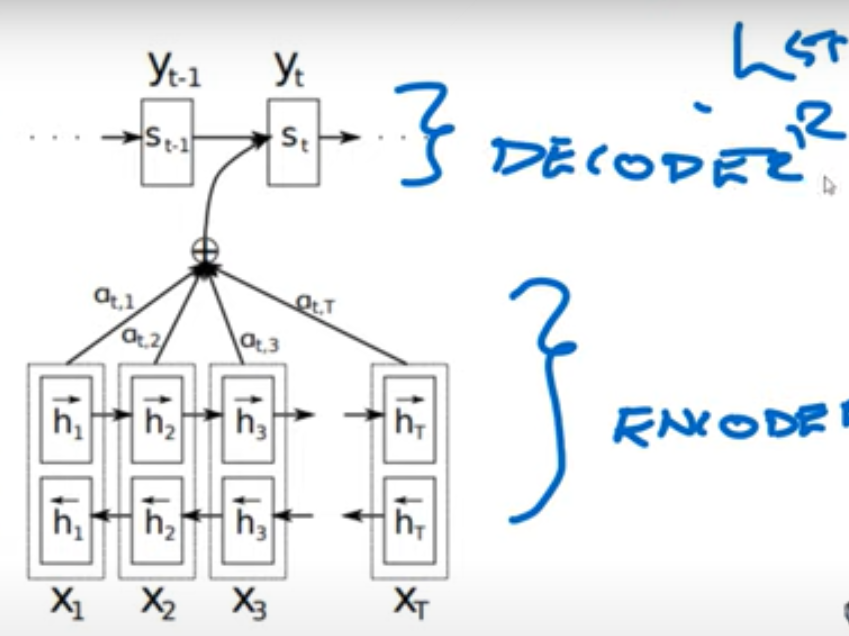

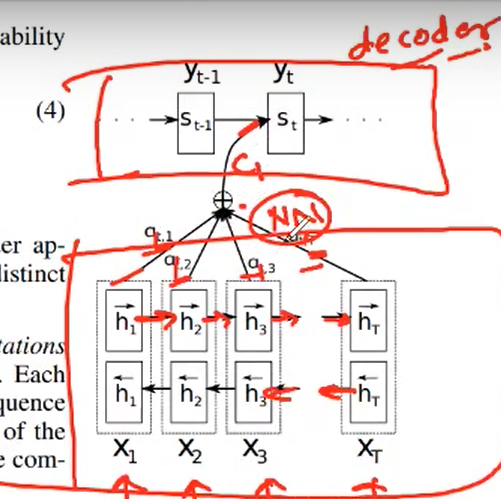

#### Bidirectional LSTM RNN Architecture

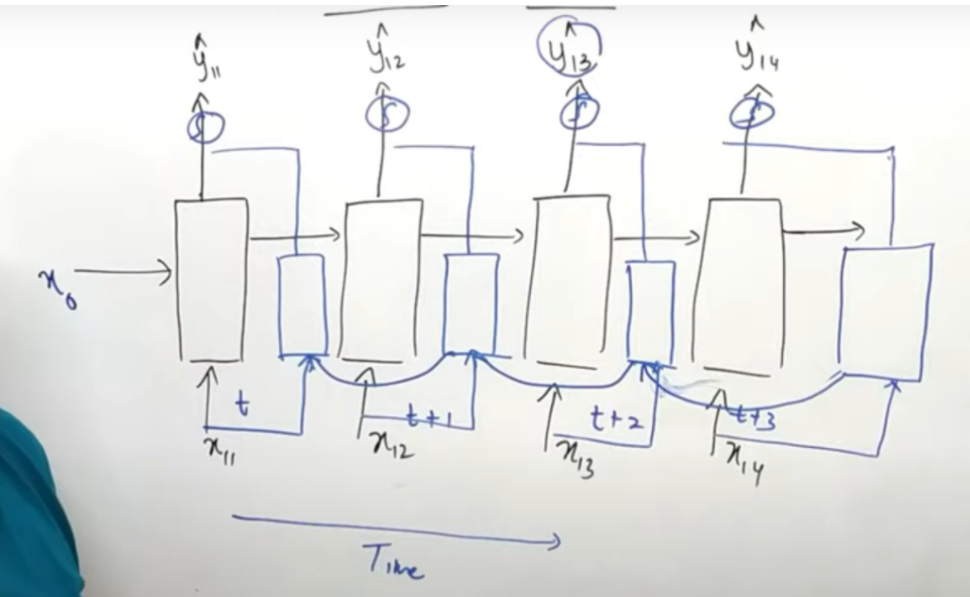

### As we know that in Bidirectional lstm - w.r.t current word we also know future words

Similarly in Attention models , When there are longer sentences , we will also know the future words of sentences when we are in first word.So in these way we are getting context of future information

#### Decoder 

In Decoder we will use LSTM RNN

#### Encoder

In Encoder we will use Bidirectional LSTM RNN


We know that output of both the direction of LSTM RNN in Encoder is combines to give it to activation to get final output

#### Attention Model consider some window of words to translate

window is denoted by tx -- These can be assumed as hyperparameter while training 


Context Vector --- Output of Encoder is given as input to Decoder.

So as per our window size --- That many no of outputs are combined to give you final output of Encoder - cl \
i-e c1 (context vector) -- h1+h2+h3 --- Windowsize =3 \
for c2 --- h1+h2+h3

Example :

When we give input as x1 -- we get output as y1 in Decoder 

But y1 -- input is c1 (h1+h2+h3) - Alpha weights will also be initialized  -- i-e We also have information of future words  

So in these we are giving attention to some of the words based on window size

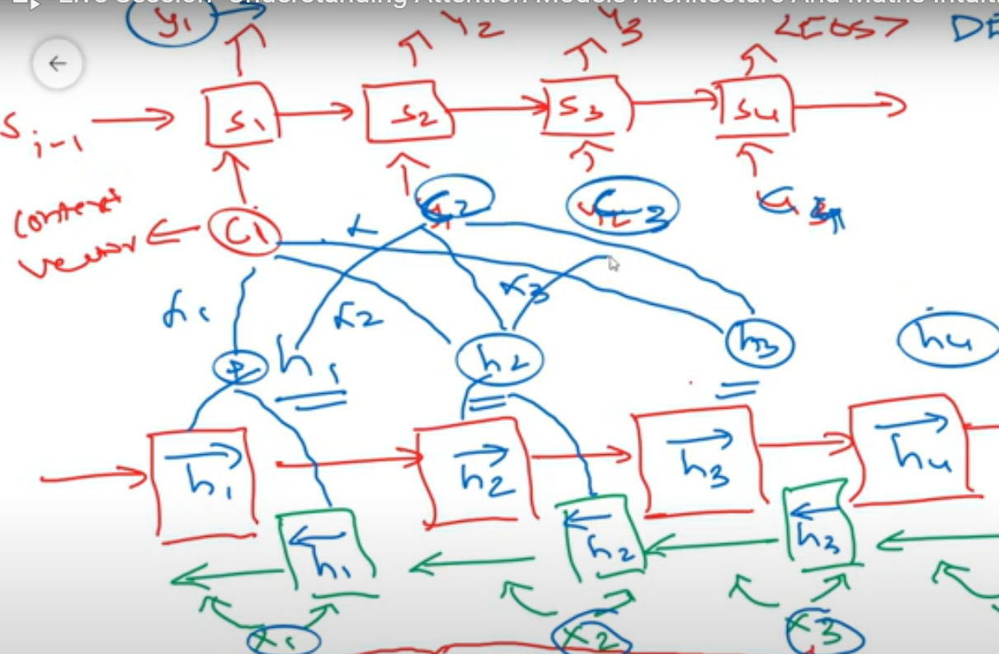

### How alpha values are getting initialized

When window size is 3 , we will get 3 alhpa values - alpha1,alpha2,alpha3 for x1 word  -- which will be passed in Encoder and Decoder to get output as y1.

How will alpha1,alpha2.alpha3 will be initialized ?

Sum of all aphas should be equal to 1 --- Using Softmax function

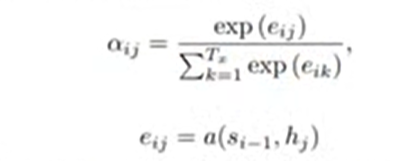

Initially they are randomly initialized

#### How context Vector are generated 

Output of Bidirectional LSTM of Encoder mulitplied by weights 

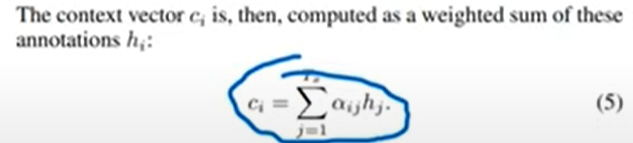

Above is the property of Feed Forward Neural Netwrork

So now we can also change these values based on backpropogation, So we need to updates values of weights alpha1,2,3


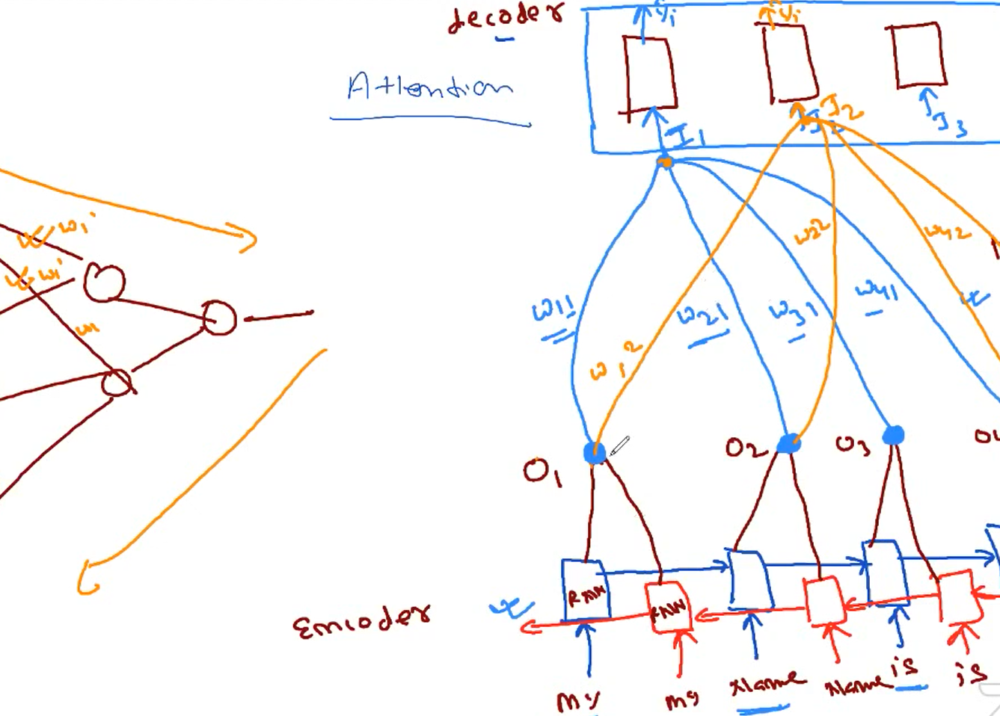

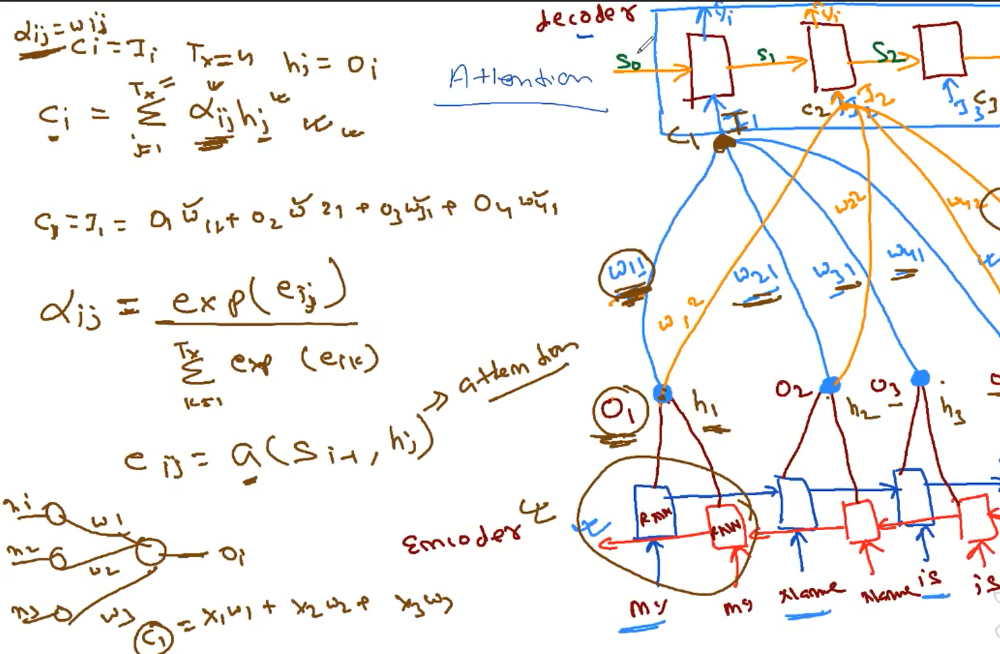

#### Bleu score is used to check accuracy

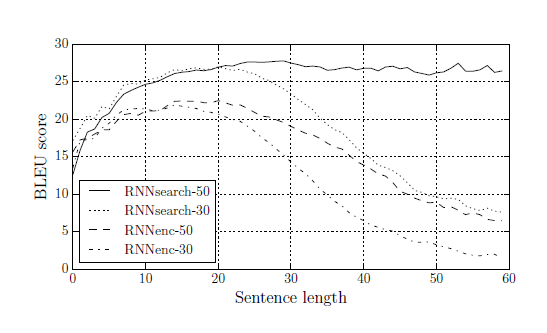

#### Results

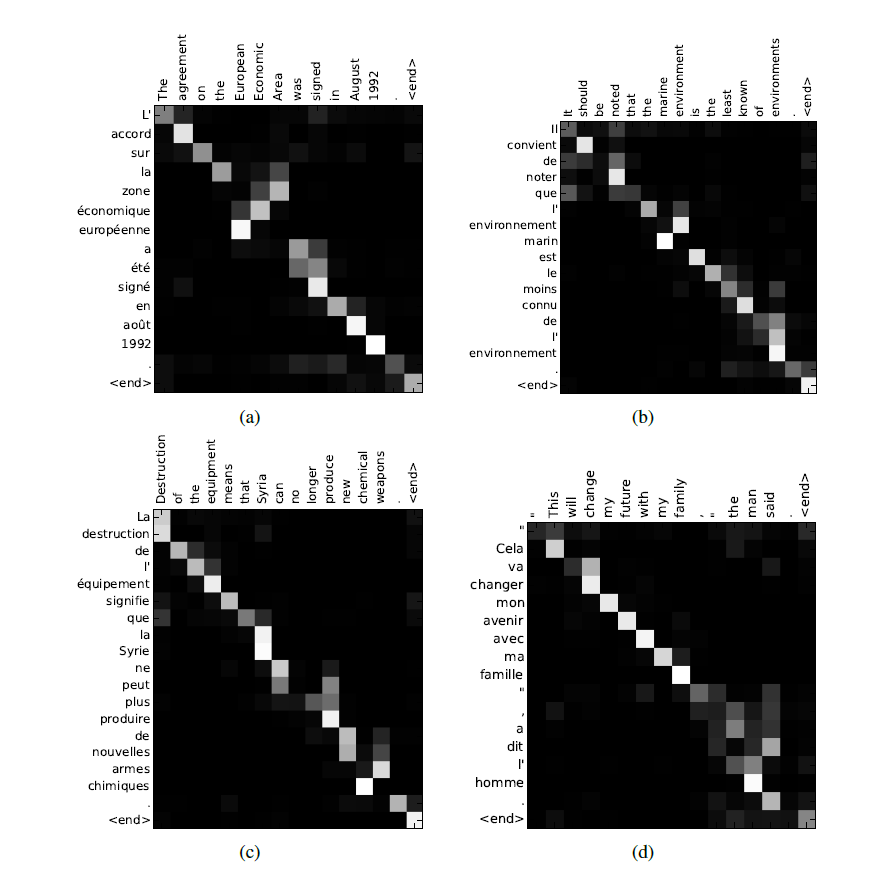


In 'a' figure , For translation of THE to french --- L' was very much important . Similarly you can check for all other words , Which word is more imp for translation of specific english word



### T48 -- Encoder,Decoder,Attention Models,Transformers,BERT -- Part1


CNN cannot be used in Machine Translation problem statement because it only does forward and backward propogation . It does not remember previous information which has been passed earlier.

We can use CNN for Image,Video,Object detection etc . But we cannot use CNN where there is sequence of information  , because it will not be able to understand the context of information 

##### Different types of RNN Models

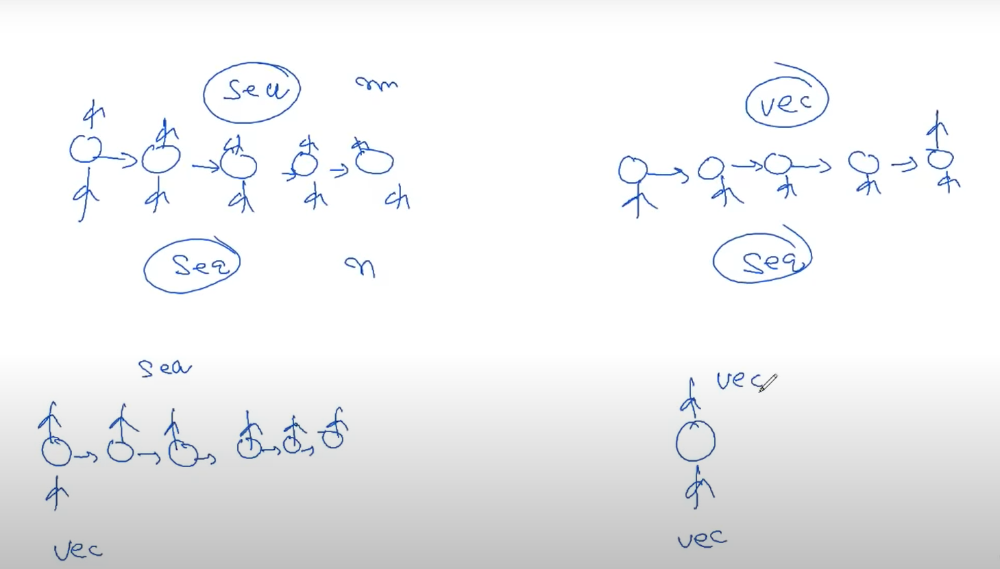

### T49- Transformers Architecture and Intuition

http://jalammar.github.io/illustrated-transformer/

https://papers.nips.cc/paper/2017/file/3f5ee243547dee91fbd053c1c4a845aa-Paper.pdf

Transformer is a black box model which helps to convert words from one language to other language.

Transformer contains Encoder and Decoder

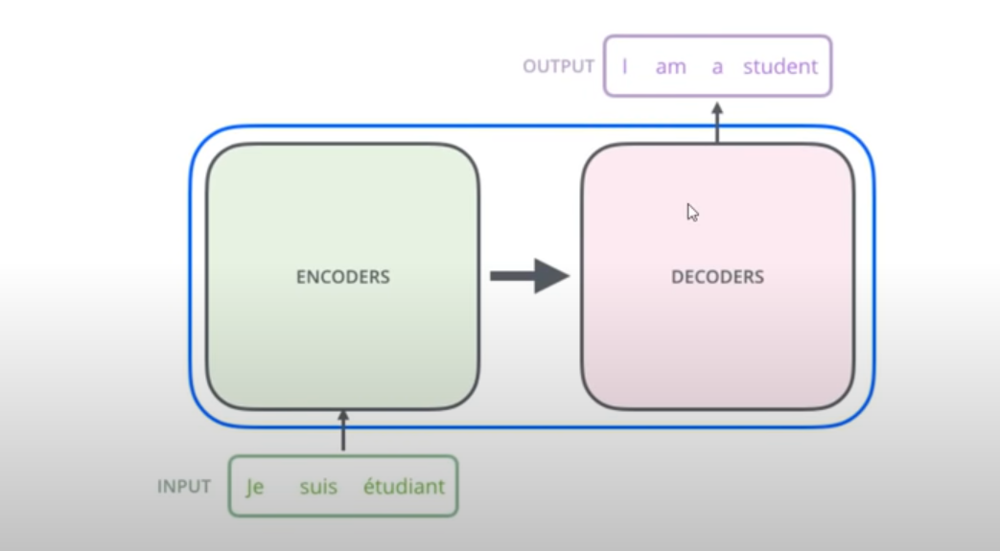

#### Encoder and Decoder Components contains layers of Encoder 

There are 6 Encoders and 6 Decoders ---- You can change number , But 6 gives good results.

Output of Final Encoder is given as input to every Decoder 

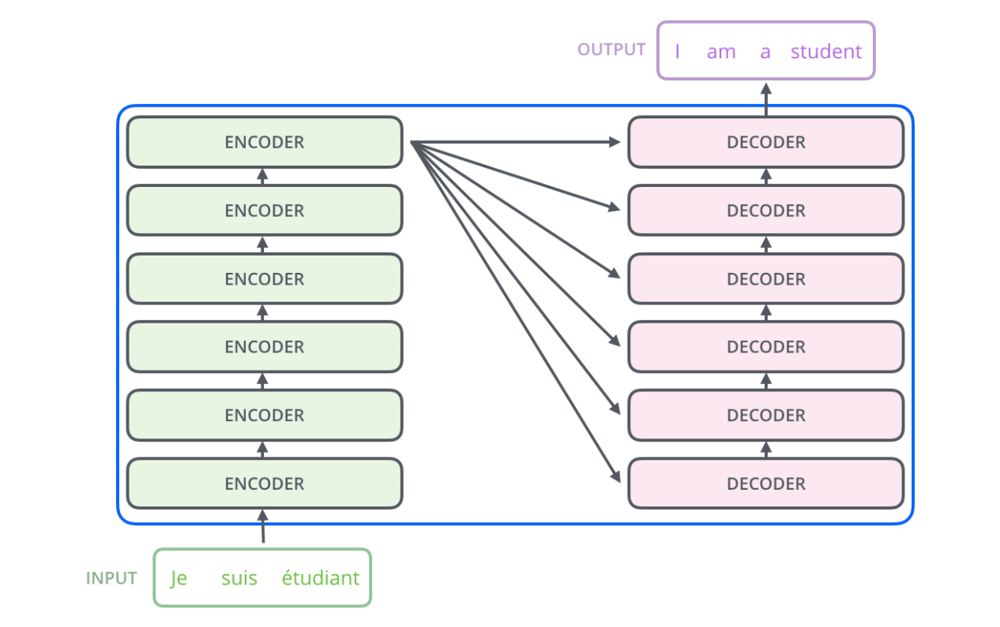

#### Ever Encoder Contains 2 Things :

1. Self Attention
2. Feed Forward Neural Network (ANN)

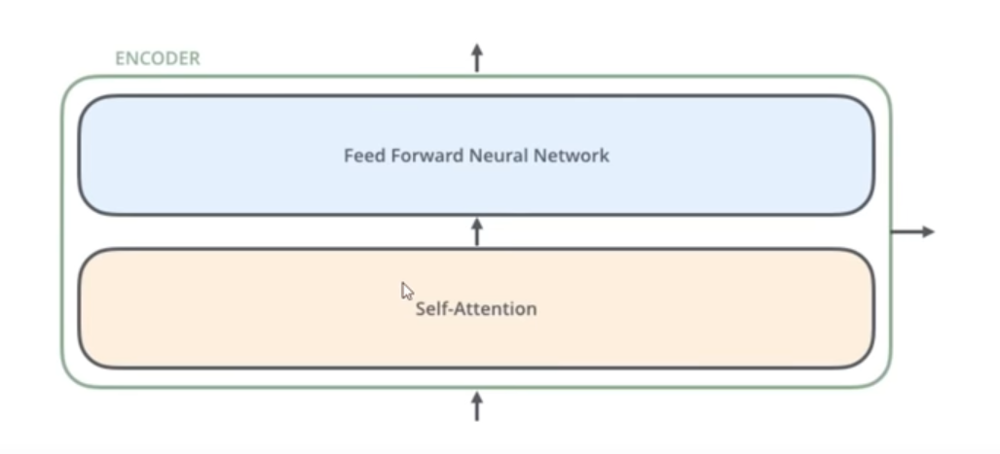

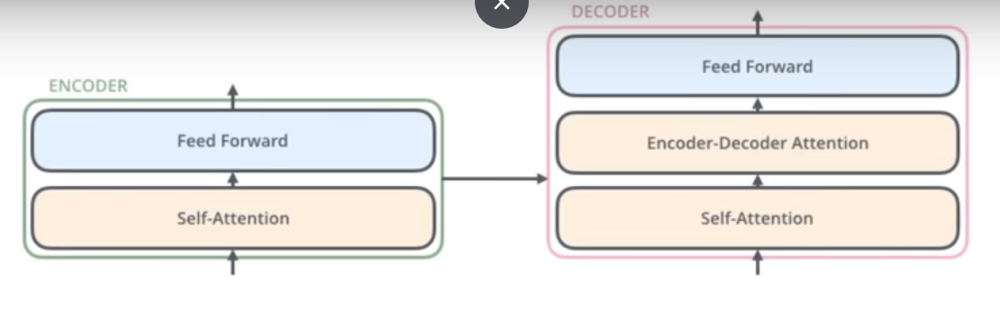

##### Now i/p of Encoder is TEXT in French -- je sui etudian 

So these text is converted to vector of certain dimensions -- Using Embedding Layer

Word2Vect is used to convert word to vector of 512

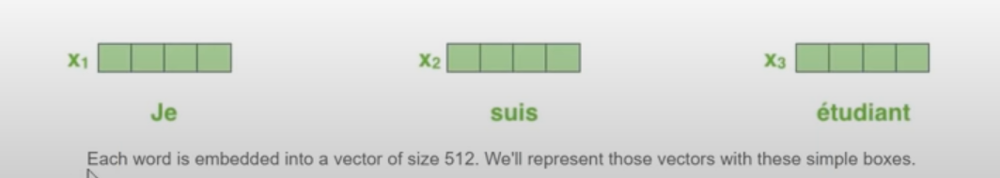

### Now these vectors are passed to Encoder (Self Attention Layer)

Unlike RNN where there was a time stamp (Each word was given at 1 timestamp ) . In Transformer whole sentence is given at same time .

So all the three words will be converted to vectors and passed to self attention model all at same time

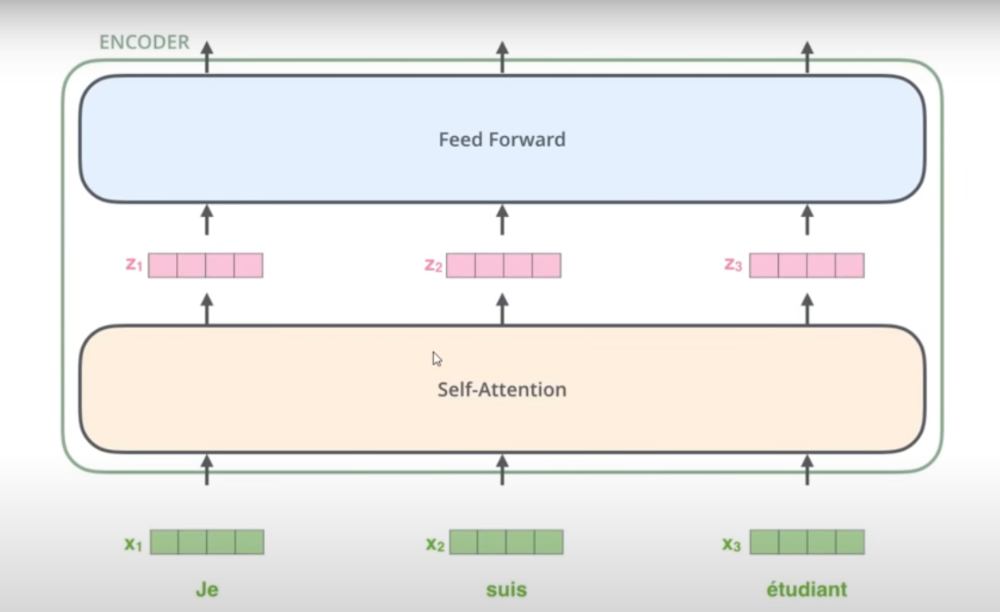

#### To simplify, we will only give 2 input words of sentences

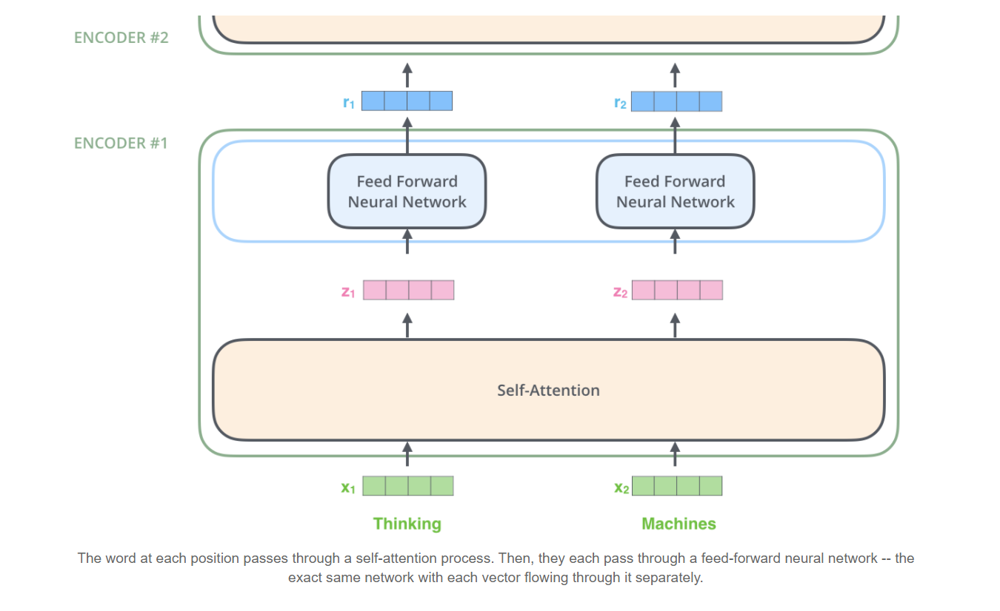

### Self Attention 

Suppose we want to translate following sentence

"The animal didnt cross the street because it was too tired"


Now what does "it" referes to in above sentence --- It is simple question to human , But Computer cannot understand these

So Self Attention model will give value w.r.t it for every word . And will find out what does "it" referes to which has high value 

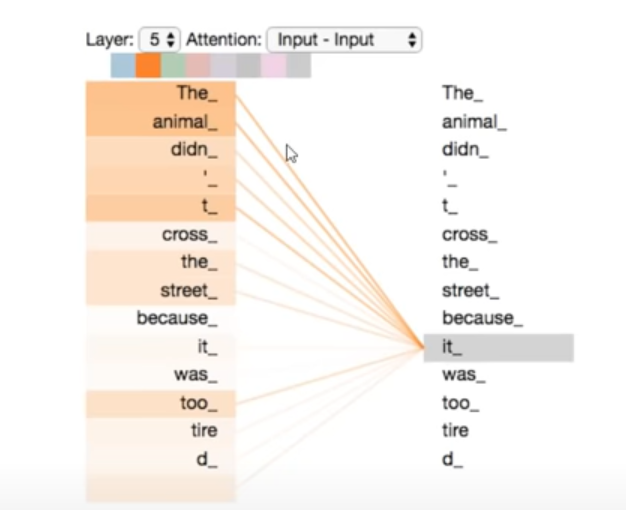

### Self Attention in detail

### Step 1

Three Weights are used , These weights are randomly initialized , Weight values will be changing based on back propogation.

Each Word Vector will be Multiplied with WQ to get q1,q2 \
Each Word Vector will be Multiplied with WK to get k1,k2 \
Each Word Vector will be Multiplied with Wv to get v1,v2

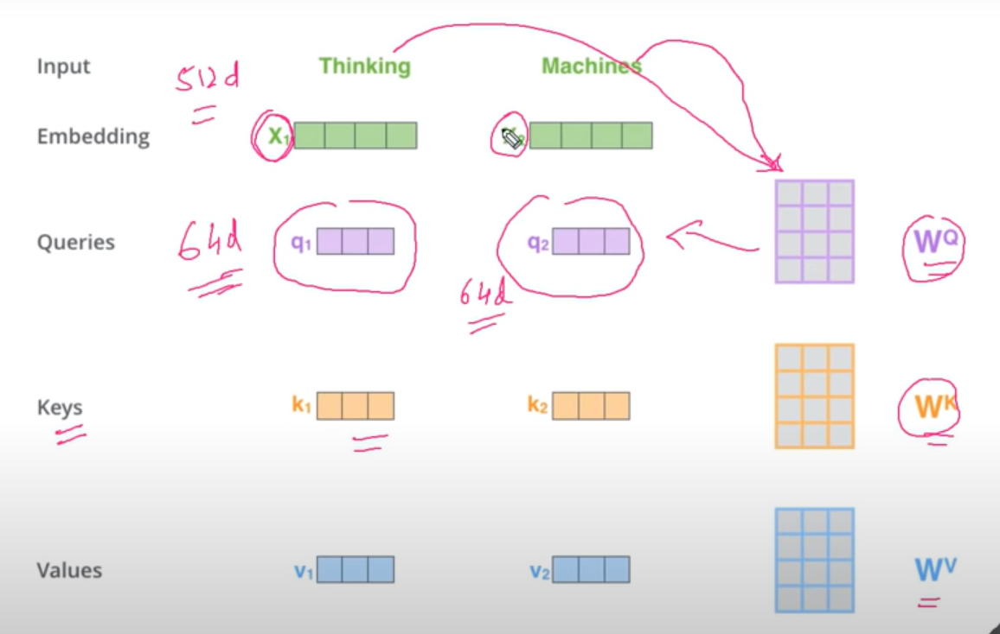

### Step 2 Calculate Score -- Multiplying Query of that Word with keys of all words

For Each word we will calculate score --- Multiplying q1,k1 

And For same word we will also multiply q1 with k2 

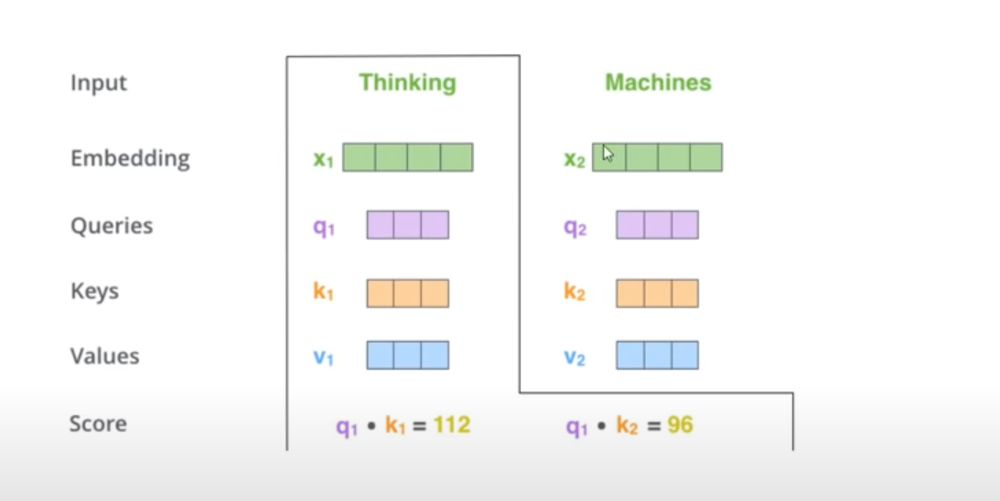

### Step 3 - Divide Scores by 8 -- We know Dimension of query is 64 -- If we do root of 64 - 8

### Step 4 - Apply Softmax Function

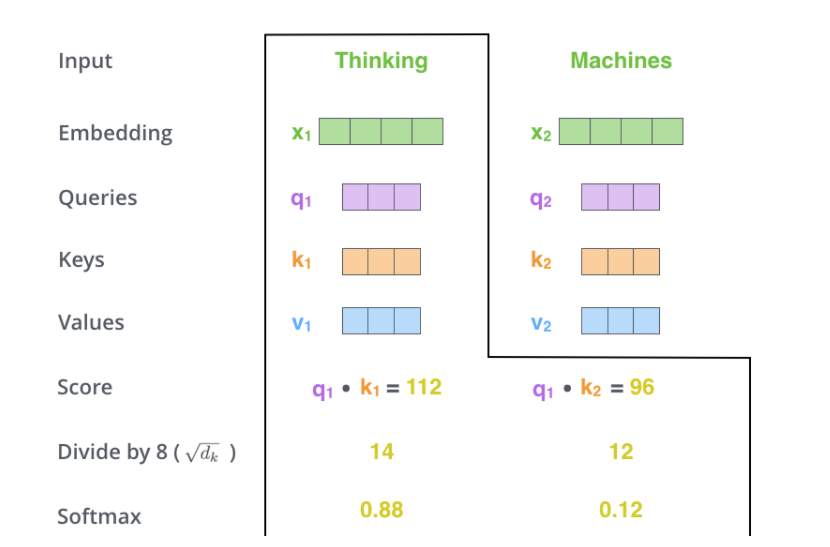

### Step 5  : Multiply Softmax value with Valus Vector

### Step 6 : z1 is calculate by adding v1 and v2

Z1 and z2 are outputs of Self Attention 

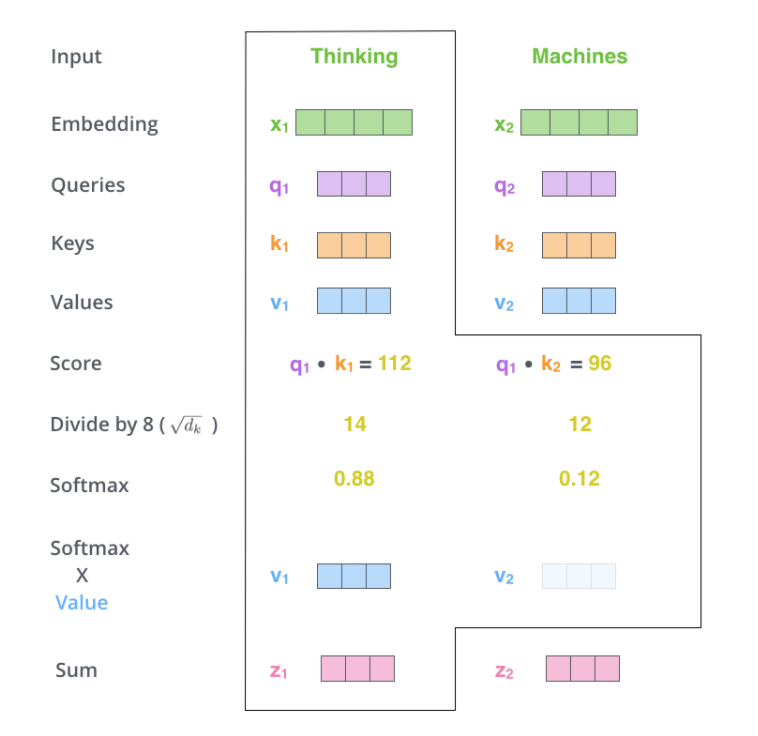

### Matrix Calculation of Self Attention

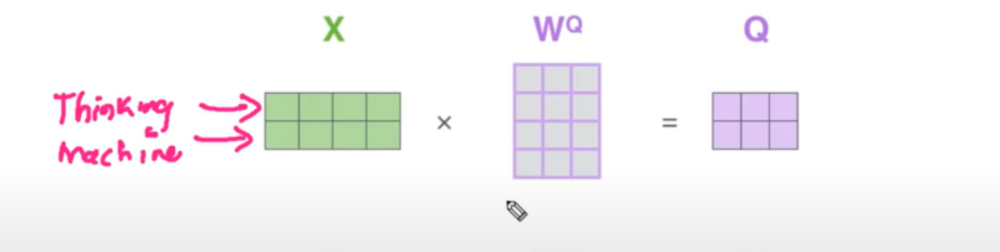

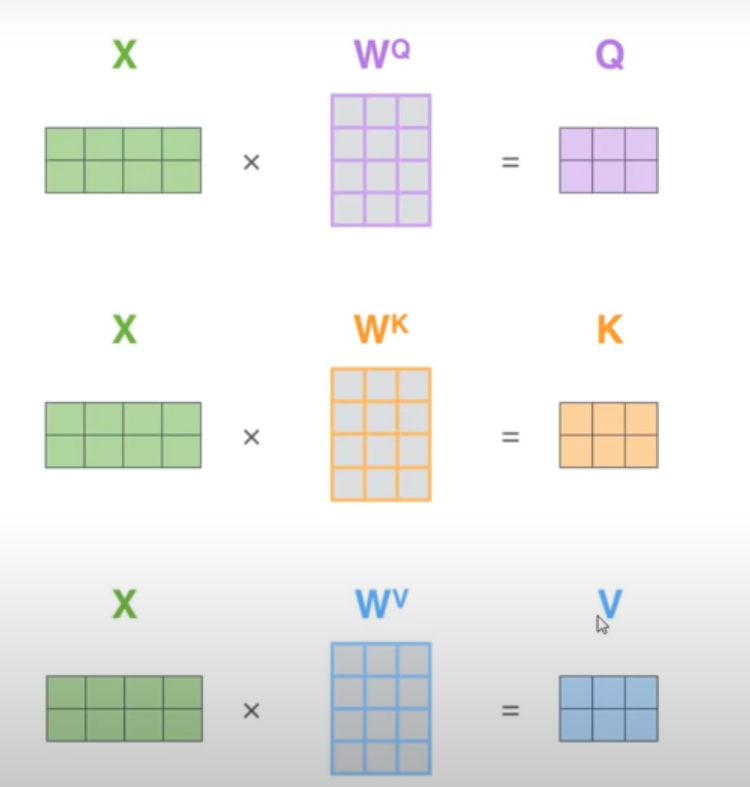

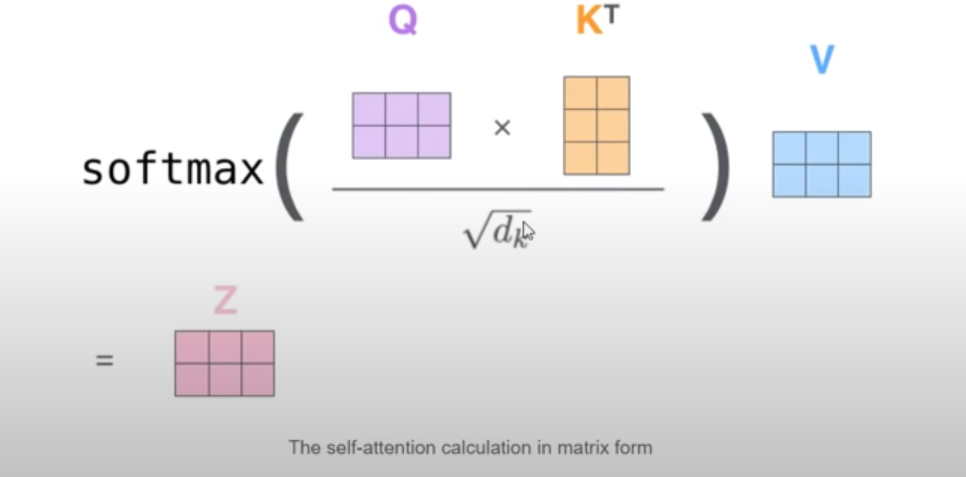

### Single Head Attention

Since We are using one WQ,WK,WV for all words we can call it as Single Head Attention

#### When we use Single Head Attention there is one problem

Now when we see our Sentence , along with "it" as it refers to animal, we are not having the importance of other words for word "it" . Some imp should also be given to "tired" word 

Because Single Weights is used for all words


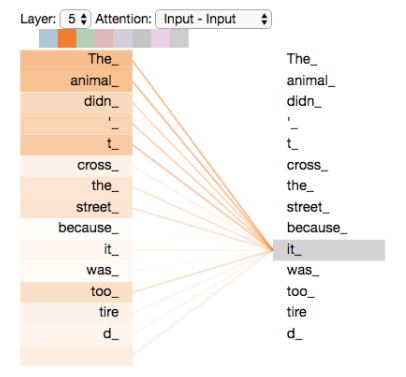


### So to overcome problem of Single Head Attention , we will use Multi Head Attention

Each word will have its own Weight vector , not like single head attention where all words have same weigths matrix of q,k,v

These will also help us to find importance of other words 


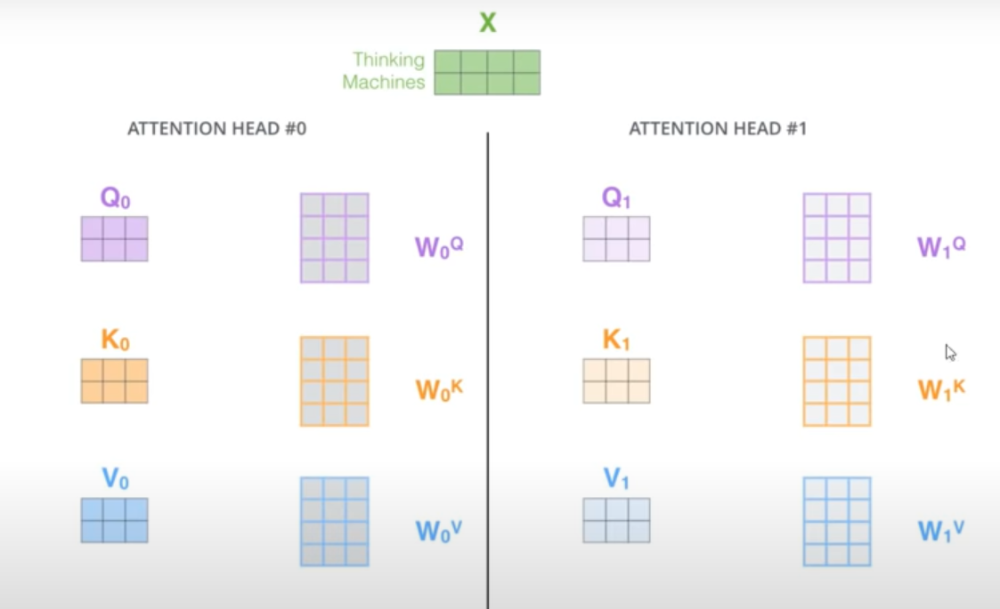

### How many total head should be considered ?

8 Heads are considered , So we will get 8 z values as output 


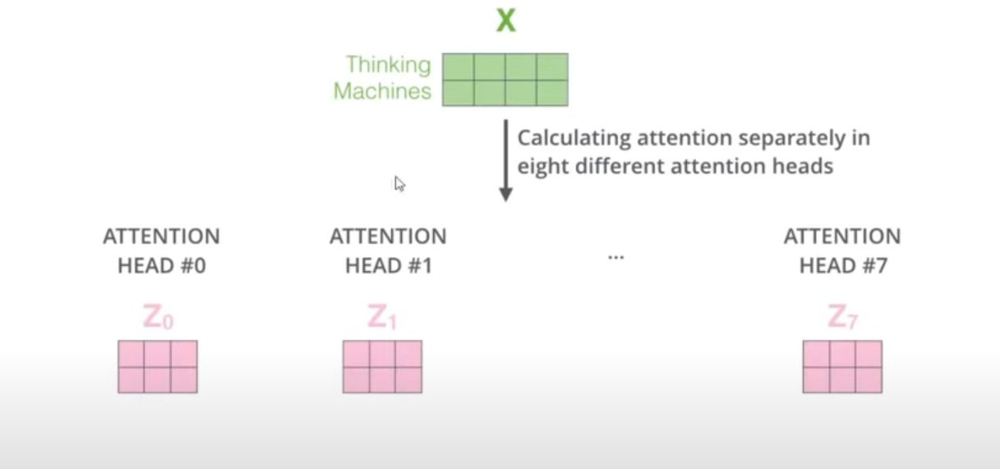

### Now we know that after we pass input to Self Attention we should only have one Z value 

Now we have 8 z values .

So now we will combine all z values  , Once we combine it , before passing it to Feed forward neural network we will again initialize another matrix

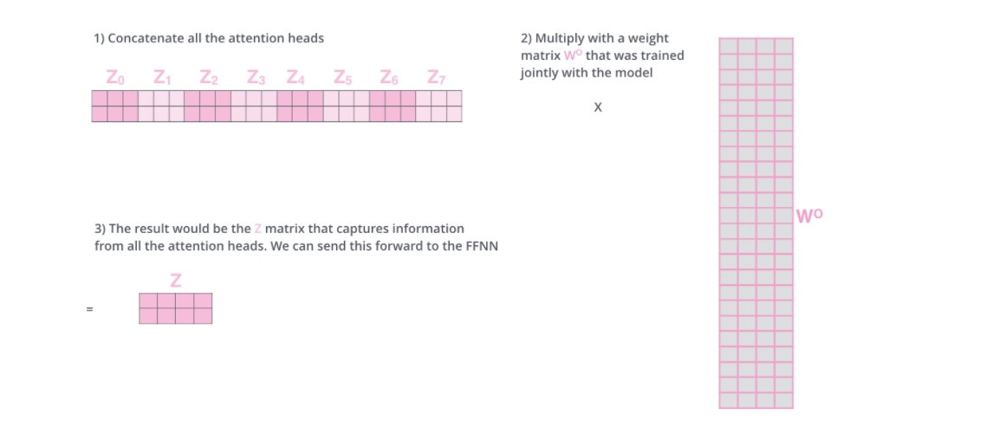

### Summary till now

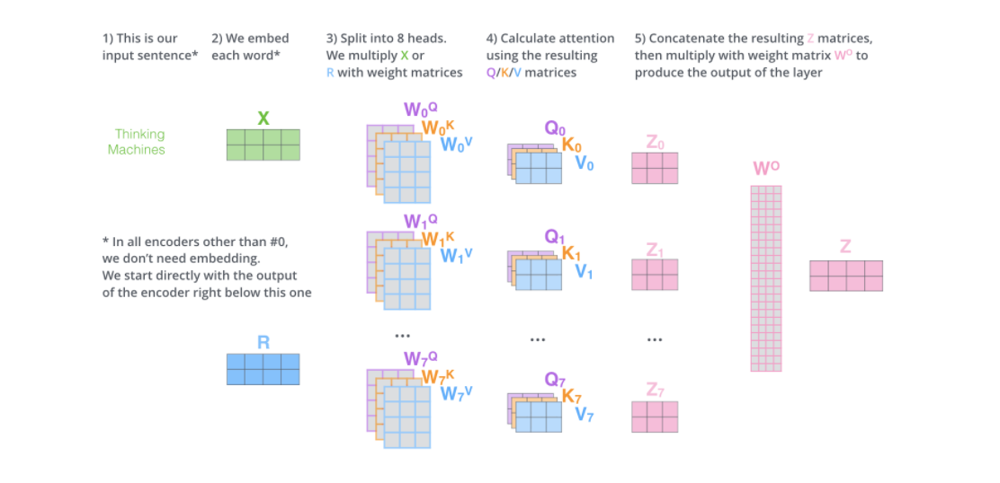

### When we see for each word , what does "it" refers to ?

##### We will Visualize with only 2 Attention Heads

We can see both animal and tired are given importance

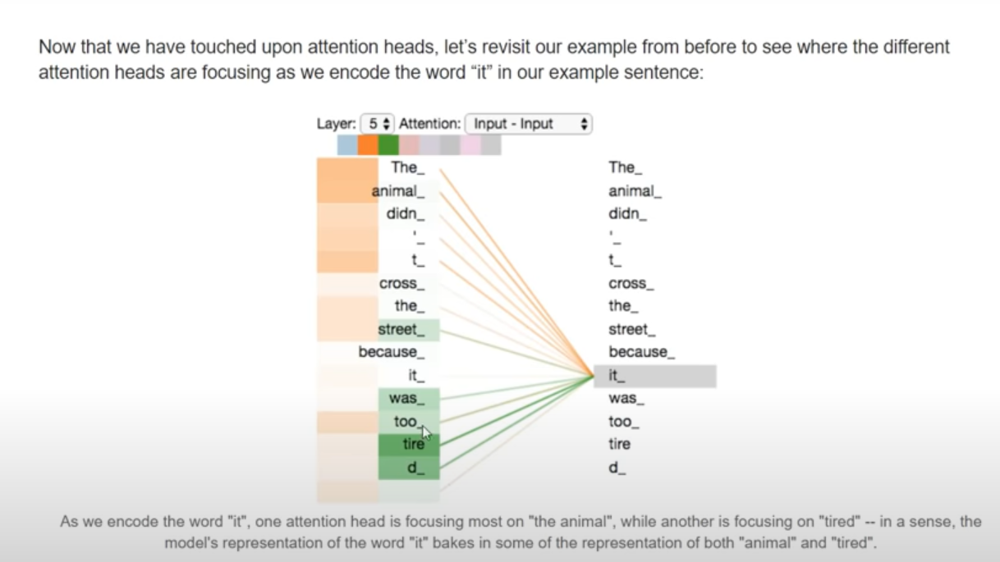

#### When we use 8 attention head

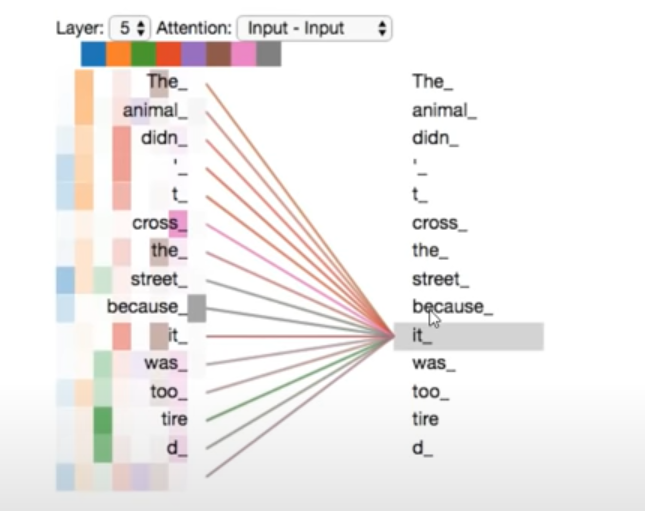

#### Before Giving Word Vector to Encoder , There is one more concept -- Positional Encoding

Positional Encoding will tell which words are near  , Because ordering of words is also imp

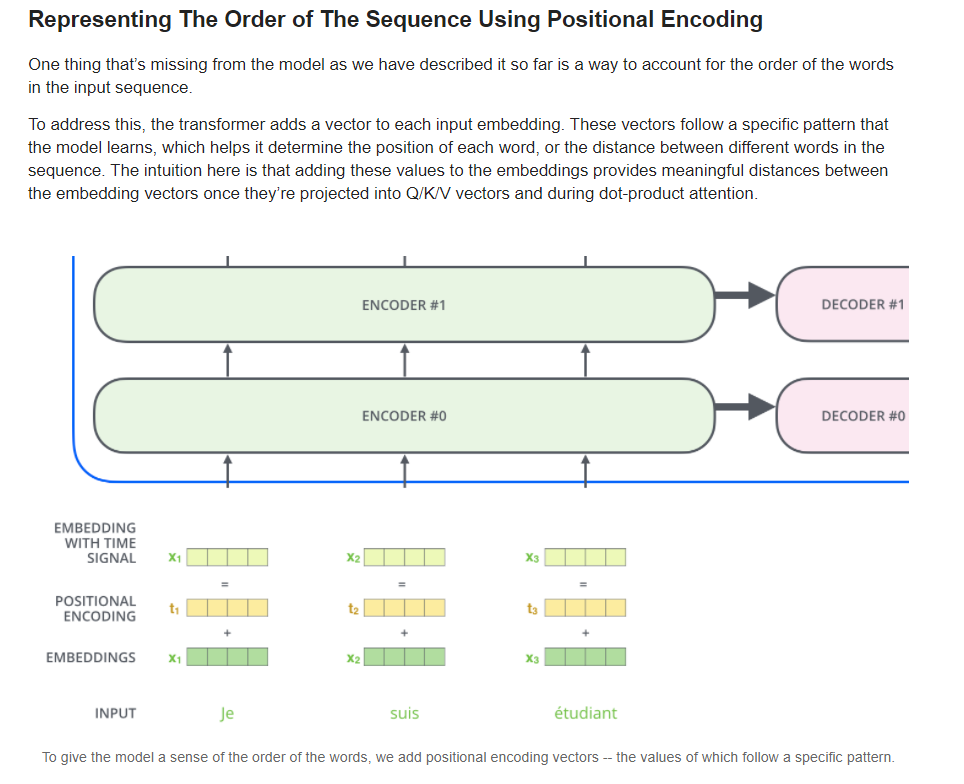

### Positional Encoding

When you find distance between positional vector of je and suis , It will be less as compared to vector of je and etudiant

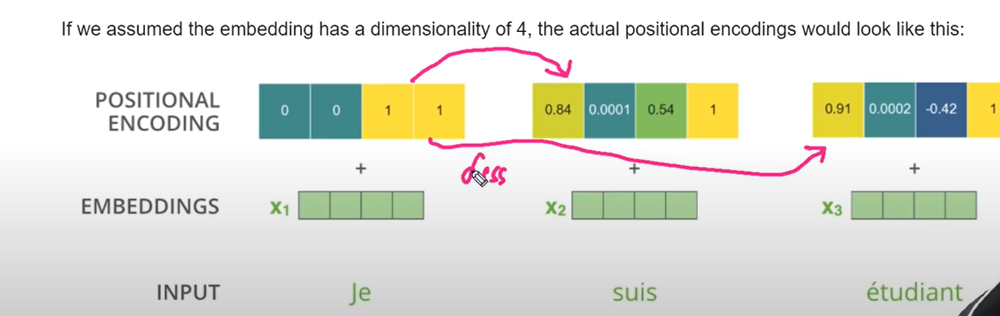

#### Before Passing vector [z1,z2...] to Feed forward neural network we will do normalization

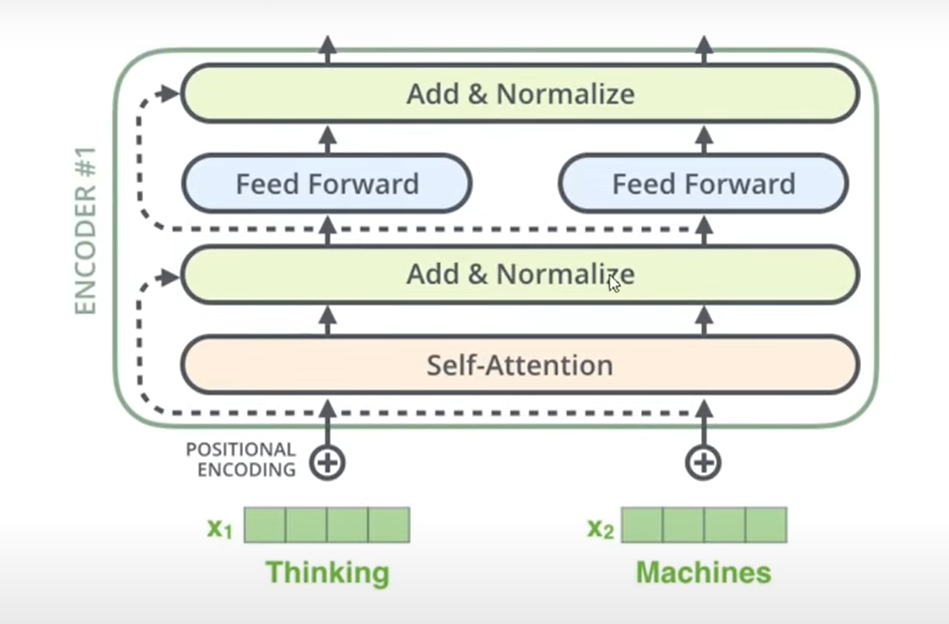

##### If sometimes self attention is not performing well , then we can skip that and directly do normalization

Normalization can also be considered as dropout


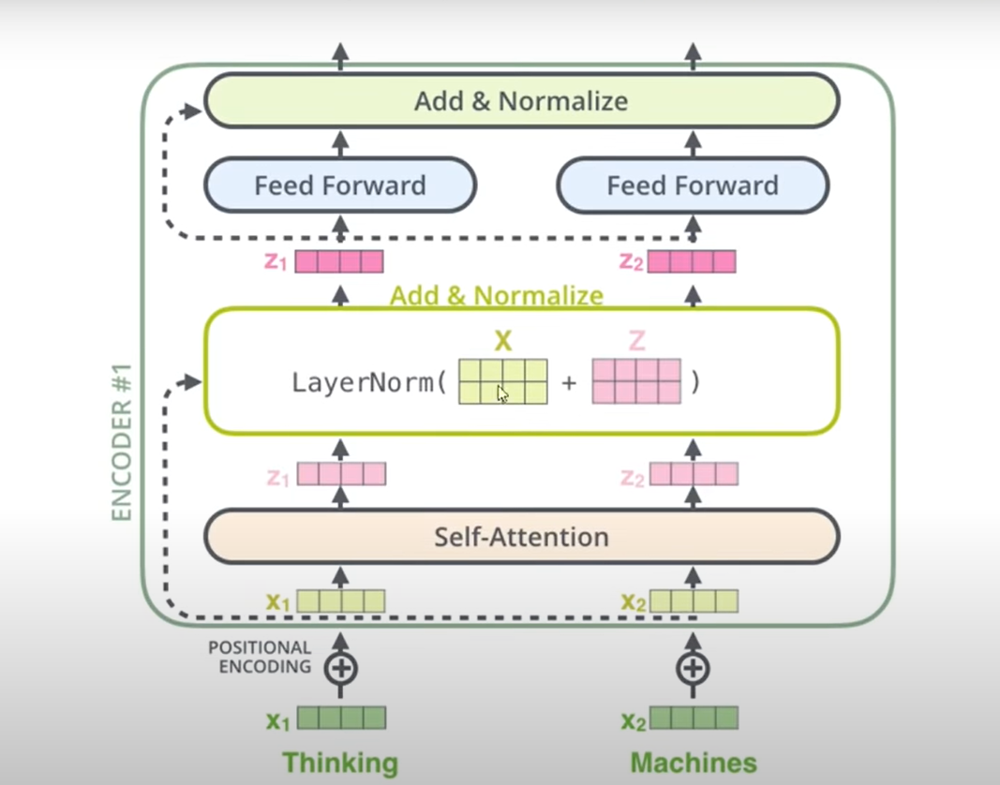

### Whole Architecture

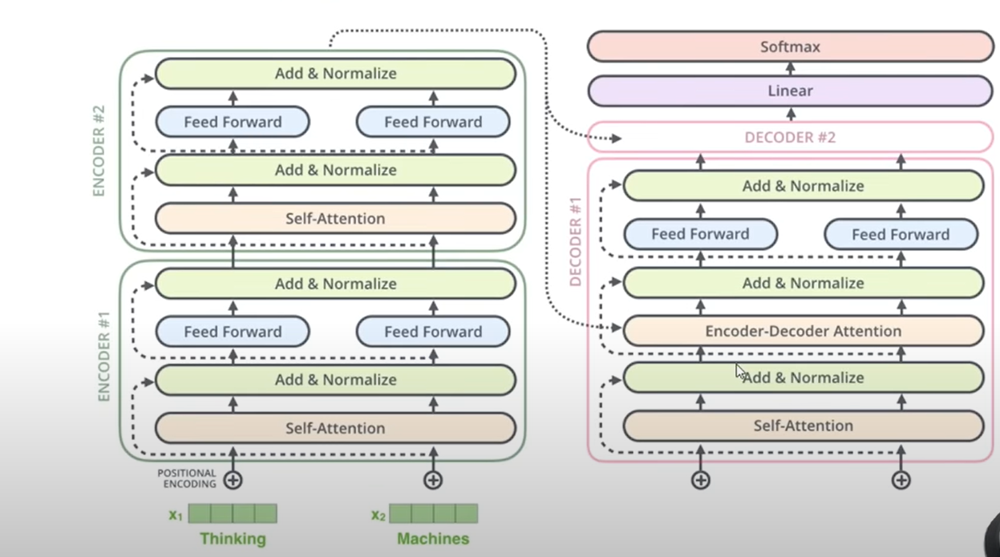

#### Decoder 

We have one extra module - Encoder - Decoder Attention 

This is similar to self attention model

Encoder output is passed to these 


### Decoder is also given some input from below

Output of Decoder will be passed as input again

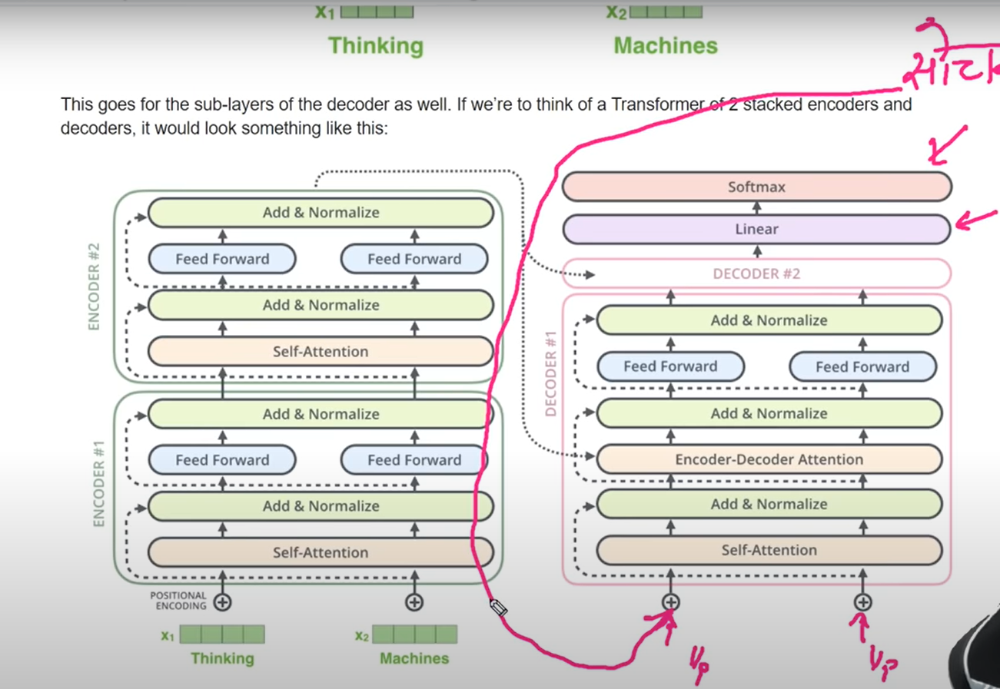

#### Output in decoder will be generated One by One

### To view the whole flow , Go see the blog 

http://jalammar.github.io/illustrated-transformer/